# Машинное обучение, ФКН ВШЭ

# Практическое задание 6. Бустинговое

## Общая информация

Дата выдачи: 12.12.2023

Мягкий дедлайн: 24.12.2023 23:59 MSK

Жёсткий дедлайн: 24.12.2023 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-06-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании вам предстоит вручную запрограммировать один из самых мощных алгоритмов машинного обучения — бустинг.

In [1]:
from warnings import filterwarnings

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.sparse import load_npz
from sklearn.model_selection import train_test_split


sns.set(style='darkgrid')
filterwarnings('ignore')

In [2]:
x = load_npz('x.npz')
y = np.load('y.npy')

Разделим на обучающую, валидационную и тестовую выборки (`random_state` оставьте равным 1337 для воспроизводимости).

In [3]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1337)

x_test, x_valid, y_test, y_valid = train_test_split(x_test, y_test, test_size=0.5, random_state=1337)

x_train.shape, x_valid.shape, x_test.shape

((18825, 169), (2354, 169), (2353, 169))

## Задание 1. Реализация градиентного бустингового (4 балла)

Вам нужно дописать код в файлике `boosting.py`. Для вас уже подготовлен шаблон класса `Boosting`, вы можете менять его по своему усмотрению.

### Инструкции для функций:

#### `__init__`

В `__init__` приходит кучка параметров, распишем что есть что:

 - `base_model_class` - класс базовой модели нашего бустинга
 - `base_model_params` - словарь с гиперпараметрами для базовой модели
 - `n_estimators` - какое количество базовых моделей нужно обучить
 - `learning_rate` - темп обучения, должен быть из полуинтервала $(0, 1]$
 - `subsample` - доля объектов, на которой будет обучаться базовая модель (какую часть составляет бутстрапная выборка от исходной обучающей)
 - `early_stopping_rounds` - число итераций, после которых при отсутствии улучшения качества на валидационной выборке обучение останавливается
 - `plot` - строить ли после обучения всех базовых моделей график с качеством

#### `fit`

В `fit` приходит две выборки, обучающая и валидационная. На обучающей мы обучаем новые базовые модели, на валидационной считаем качество для ранней остановки (если это предусматривают параметры).

Сначала нам нужно сделать какую-то нулевую модель, сделать предсказания для обучающей и валидационной выборок (в шаблоне это нулевая модель, соответственно предсказания это просто `np.zeros`). После этого нужно обучить `n_estimators` базовых моделей (как и на что обучаются базовые модели смотрите в лекциях и семинарах). После каждой обученной базовой модели мы должны обновить текущие предсказания, посчитать ошибку на обучающей и валидационной выборках (используем `loss_fn` для этого), проверить на раннюю остановку.

После всего цикла обучения надо нарисовать график (если `plot`).


#### `fit_new_base_model`

В `fit_new_base_model` приходит обучающая выборка (целиком) и текущие предсказания для неё. Мы должны сгенерировать бутстрап выборку для обучения базовой модели и обучить базовую модель. После обучения модели запускаем поиск оптимальной гаммы, добавляем новую модель и гамму (не забываем про темп обучения) в соответствующие списки.

#### `predict_proba`

В `predict_proba` приходит выборка, нужно предсказать вероятности для неё. Суммируем предсказания базовых моделей на этой выборке (не забываем про гаммы) и накидываем сигмоиду.

In [4]:
%load_ext autoreload

In [5]:
%autoreload 2

from boosting import Boosting

### Проверка кода

У автора задания всё учится около одной секунды.

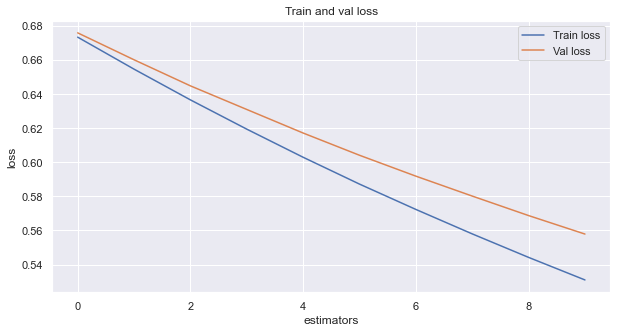

CPU times: user 1.02 s, sys: 91.7 ms, total: 1.12 s
Wall time: 876 ms
Train ROC-AUC 0.9892
Valid ROC-AUC 0.9146
Test ROC-AUC 0.9119


In [6]:
boosting = Boosting(plot = True)

%time boosting.fit(x_train, y_train, x_valid, y_valid)

assert len(boosting.models) == boosting.n_estimators
assert len(boosting.gammas) == boosting.n_estimators

assert boosting.predict_proba(x_test).shape == (x_test.shape[0], 2)

print(f'Train ROC-AUC {boosting.score(x_train, y_train):.4f}')
print(f'Valid ROC-AUC {boosting.score(x_valid, y_valid):.4f}')
print(f'Test ROC-AUC {boosting.score(x_test, y_test):.4f}')

## Задание 2. Обучение градиентного бустингового (1 балл)

Оцените качество на тестовой выборке вашей имплементации бустинга для различной максимальной глубины решающего дерева в качестве базовой модели. Здесь и далее мы будем использовать метрику ROC-AUC.

Перебирайте максимальную глубину от 1 до 30 с шагом 2 (остальные параметры бустинга стоит оставить равными по умолчанию). Постройте график зависимости качества на обучающей и тестовой выборке в зависимости от глубины.

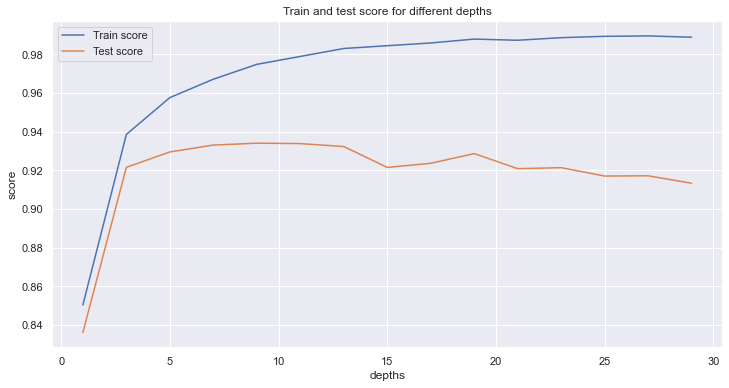

In [128]:
from collections import defaultdict
results = {}

depths = range(1, 30, 2)

all_scores = defaultdict(list)

for depth in depths:
    boosting = Boosting(base_model_params={'max_depth': depth})
    boosting.fit(x_train, y_train, x_valid, y_valid)
    all_scores['train_score'].append(boosting.score(x_train, y_train))
    all_scores['test_score'].append(boosting.score(x_test, y_test))
    
    
plt.figure(figsize=(12, 6))
plt.title('Train and test score for different depths')
plt.plot(depths, all_scores['train_score'], label='Train score')
plt.plot(depths, all_scores['test_score'], label='Test score')
plt.ylabel('score')
plt.xlabel('depths')
plt.legend()
plt.show()

In [129]:
best_depth = np.argmax(all_scores['test_score']) * 2 + 1
print(f'Лучшая глубина: {best_depth}')

Лучшая глубина: 9


In [130]:
ans = np.max(all_scores['test_score'])
print(f'Лучший score: {ans}')

Лучший score: 0.9340761553273933


**Какая из моделей имеет лучшее качество? Как вы можете это объяснить?**

Лучшая глубина получилась достаточно большой. Я думаю дело в том, что мы учимся всего на 10 деревьях и чтобы получить хорошее качество нужны модели посложнее. Так как базово градиентный бустинг обучается на простых деревьях но количество их большее


## Задание 3. Подбираем гиперпараметры и ищем лучшую модель (3 балла)

Подберите по валидационной выборке основные гиперпараметры для вашей модели бустинга. Следует подобрать все основные параметры для самого градиентного бустинга и для самих базовых моделей. Существуют библиотеки для подбора гиперпараметров, попробуйте использовать какую-нибудь из следующих двух - [Hyperopt](https://github.com/hyperopt/hyperopt), [Optuna](https://optuna.org/).

In [36]:
x_train.shape

(18825, 169)

In [136]:
from hyperopt import hp, fmin, tpe
def objective(params):
    base_model_params = {
        'max_depth': int(params['max_depth']),
        'min_samples_split': int(params['min_samples_split']),
        'min_samples_leaf': int(params['min_samples_leaf']),
        'max_features': int(params['max_features'])
    }
    boosting_params = {
        'n_estimators': int(params['n_estimators']),
        'learning_rate': params['learning_rate'],
        'early_stopping_rounds': int(params['early_stopping_rounds'])
    }
    
    boosting = Boosting(base_model_params=base_model_params, **boosting_params)
    boosting.fit(x_train, y_train, x_valid, y_valid)
    return -boosting.score(x_valid, y_valid)


space = {
    'max_depth': hp.quniform('max_depth', 1, 20, 1),
    'min_samples_split': hp.quniform('min_samples_split', 2, 30, 1),
    'min_samples_leaf': hp.quniform('min_samples_leaf', 1, 30, 1),
    'max_features': hp.quniform('max_features', 10, 169, 10),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'n_estimators': hp.quniform('n_estimators', 10, 150, 10),
    'early_stopping_rounds': hp.quniform('early_stopping_rounds', 1, 25, 1),

}                        

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=100)

best_hypers = {
    'max_depth': best['max_depth'],
    'min_samples_split': int(best['min_samples_split']),
    'min_samples_leaf': int(best['min_samples_leaf']),
    'max_features': best['max_features'],
    'n_estimators': best['n_estimators'],
    'learning_rate': best['learning_rate'],
    'early_stopping_rounds': best['early_stopping_rounds']
}
best_hypers

100%|██████████| 100/100 [03:17<00:00,  1.97s/trial, best loss: -0.9433312340910559]


{'max_depth': 17.0,
 'min_samples_split': 26,
 'min_samples_leaf': 17,
 'max_features': 50.0,
 'n_estimators': 140.0,
 'learning_rate': 0.17591970665778128,
 'early_stopping_rounds': 21.0}

In [145]:
boost = Boosting(base_model_params={
    'max_depth': 17,
    'min_samples_split': 26,
    'min_samples_leaf': 17,
    'max_features': 50
}, n_estimators=140, learning_rate=0.17591970665778128, early_stopping_rounds=21)
boost.fit(x_train, y_train, x_valid, y_valid)
boost.score(x_test, y_test)

0.938370599080808

## Задание 4. Интерпретация бустингового (2 балл)

Постройте калибровочную кривую для вашей лучшей модели бустинга. Насколько хорошо бустинг оценивает вероятности? Постройте также калибровочную кривую для логистической регрессии, сравните их между собой. Проанализируйте полученные результаты.

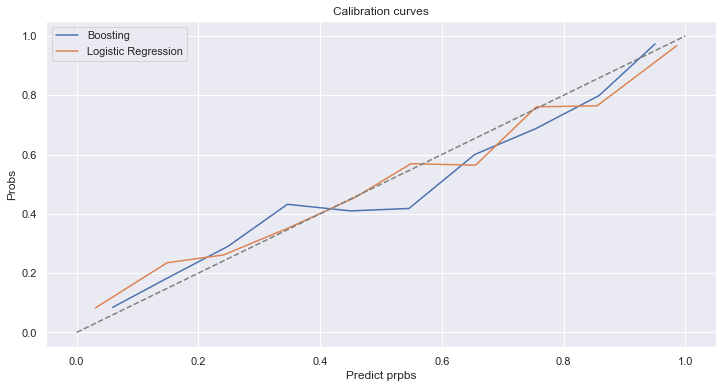

In [138]:
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve


boost = Boosting(base_model_params={
    'max_depth': 17,
    'min_samples_split': 26,
    'min_samples_leaf': 17,
    'max_features': 50
}, n_estimators=140, learning_rate=0.17591970665778128, early_stopping_rounds=21)
boost.fit(x_train, y_train, x_valid, y_valid)

log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)

y_prob_b, pred_prob_b = calibration_curve(y_test, boost.predict_proba(x_test)[:, 1], n_bins=10)
y_prob_l, pred_prob_l = calibration_curve(y_test, log_reg.predict_proba(x_test)[:, 1], n_bins=10)

plt.figure(figsize=(12, 6))
plt.plot(pred_prob_b, y_prob_b, label='Boosting')
plt.plot(pred_prob_l, y_prob_l, label='Logistic Regression')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')

plt.xlabel('Predict prpbs')
plt.ylabel('Probs')
plt.title('Calibration curves')
plt.legend()
plt.show()

Бустинг довольно неплохо оценивает вероятности. Логистическая регрессия тоже неплохо оценила вероятности. Я думаю, что бустинг оценил вероятности чуть лучше, чем лог-рег

Теперь попробуем оценить важность признаков для бустинга.

Поскольку наша базовая модель - это дерево из `sklearn`, мы можем вычислить важность признака отдельно для каждого дерева и усреднить (воспользуйтесь `feature_importances_` у `DecisionTreeRegressor`), после этого нормировать значения, чтобы они суммировались в единицу (обратите внимание, что они должны быть неотрицательными - иначе вы что-то сделали не так).

Допишите в вашей реализации бустинга функцию `feature_importances_` чтобы она возвращала описанные выше важности признаков.

Нарисуйте столбчатую диаграмму важности признаков. На соседнем графике нарисуйте важность признаков для логистической регрессии, для этого используйте модули весов. Сравните графики. Проанализируйте полученные результаты.

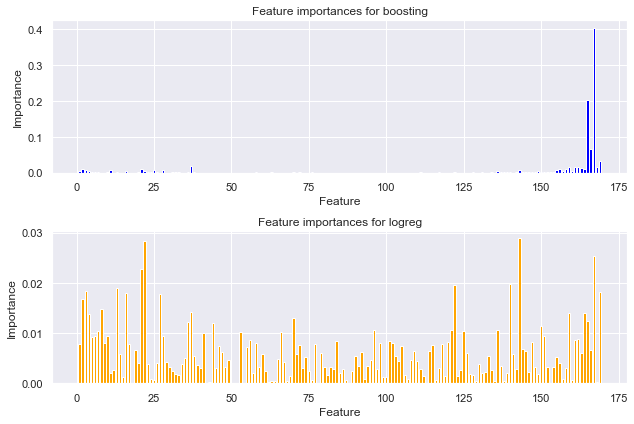

In [141]:
plt.figure(figsize=(9, 6))

plt.subplot(2,1,1)
plt.bar(x=np.arange(1, x_train.shape[1] + 1), height=boost.feature_importances_, color = 'blue')
plt.title('Feature importances for boosting')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.tight_layout()

plt.subplot(2,1,2)
plt.bar(x=np.arange(1, x_train.shape[1] + 1), height=(np.abs(log_reg.coef_.reshape(-1)) / np.sum(np.abs(log_reg.coef_))), color = 'orange')
plt.title('Feature importances for logreg')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.tight_layout()
plt.show()
        

Бустинг концентрируется на важных признаках и берет только их. А логистическая регрессия берет много признаков, не орентируясь на их важность. 

Кстати, чаще всего излишние признаки могут вредить качеству бустинга. Попробуйте отфильтровать на основании диаграммы хвост наименее важных признаков и снова обучить модель (с теми же гиперпараметрами). Стало ли лучше?

In [142]:
mask = boost.feature_importances_ >= 0
last_boost = Boosting(base_model_params={
    'max_depth': 17,
    'min_samples_split': 26,
    'min_samples_leaf': 17,
    'max_features': 50
}, n_estimators=140, learning_rate=0.17591970665778128, early_stopping_rounds=21)
last_boost.fit(x_train[:, mask], y_train, x_valid[:, mask], y_valid)
last_boost.score(x_test[:, mask], y_test)


0.939075974260104

In [146]:
print(f'Был такой score: {boost.score(x_test, y_test)}')

Был такой score: 0.938370599080808


Видим, что качество чуууть улучшилось, так как бустинг перестал учиться на неважных признаках

## Задание 5 (бонус). Блендинговое (1 балл)

Реализуйте блендинг над вашей лучшей моделью и логистической регрессией. Улучшилось ли качество?

In [156]:
from sklearn.metrics import roc_auc_score



X_train_blend, X_val_blend, y_train_blend, y_val_blend = train_test_split(x_train, y_train, test_size=0.5, random_state=42)

boost_new = Boosting(base_model_params={
    'max_depth': 17,
    'min_samples_split': 26,
    'min_samples_leaf': 17,
    'max_features': 50
}, n_estimators=140, learning_rate=0.17591970665778128, early_stopping_rounds=21)


log_reg = LogisticRegression()

boost_new.fit(X_train_blend, y_train_blend, X_val_blend, y_val_blend)
log_reg.fit(X_train_blend, y_train_blend)

boost_pred = boost_new.predict_proba(X_val_blend)[:, 1]
log_reg_pred = log_reg.predict_proba(X_val_blend)[:, 1]

X_new = np.column_stack((boost_pred, log_reg_pred))

meta_model = LogisticRegression()
meta_model.fit(X_new, y_val_blend)


boost_pred_test = boost_new.predict_proba(x_test)[:, 1]
log_reg_pred_test = log_reg.predict_proba(x_test)[:, 1]

X_test_new = np.column_stack((boost_pred_test, log_reg_pred_test))

y_pred_test = meta_model.predict_proba(X_test_new)[:, 1]

roc_auc_score(y_test, y_pred_test)



0.9418659850139264

Качество стало чууть лучше. Ансамбль сработал как надо) 

## Задание 6 (бонус). Катбустовое (1 балл)

Запустите [CatBoost](https://catboost.ai/en/docs/concepts/python-quickstart) на наших данных, сравните с вашей реализацией. Где получилось лучше?

In [165]:
from catboost import CatBoostClassifier

model = CatBoostClassifier()
model.fit(x_train, y_train)
y_pred = model.predict_proba(x_test)[:, 1]
roc_auc_score(y_test, y_pred)


Learning rate set to 0.036078
0:	learn: 0.6491461	total: 8.29ms	remaining: 8.28s
1:	learn: 0.6106101	total: 12.2ms	remaining: 6.1s
2:	learn: 0.5804629	total: 16.1ms	remaining: 5.34s
3:	learn: 0.5522560	total: 19.8ms	remaining: 4.93s
4:	learn: 0.5262195	total: 23.8ms	remaining: 4.73s
5:	learn: 0.5008076	total: 27.4ms	remaining: 4.53s
6:	learn: 0.4812964	total: 30.9ms	remaining: 4.38s
7:	learn: 0.4620364	total: 34.9ms	remaining: 4.32s
8:	learn: 0.4461814	total: 38.5ms	remaining: 4.23s
9:	learn: 0.4303349	total: 42.5ms	remaining: 4.2s
10:	learn: 0.4142073	total: 46.1ms	remaining: 4.14s
11:	learn: 0.4011999	total: 50.9ms	remaining: 4.19s
12:	learn: 0.3907486	total: 54.8ms	remaining: 4.16s
13:	learn: 0.3808040	total: 58.8ms	remaining: 4.14s
14:	learn: 0.3710193	total: 62.8ms	remaining: 4.12s
15:	learn: 0.3641415	total: 66.7ms	remaining: 4.1s
16:	learn: 0.3554514	total: 70.7ms	remaining: 4.08s
17:	learn: 0.3492319	total: 74.4ms	remaining: 4.06s
18:	learn: 0.3419545	total: 78.8ms	remaining: 4

205:	learn: 0.2071502	total: 784ms	remaining: 3.02s
206:	learn: 0.2070268	total: 788ms	remaining: 3.02s
207:	learn: 0.2068994	total: 791ms	remaining: 3.01s
208:	learn: 0.2067449	total: 795ms	remaining: 3.01s
209:	learn: 0.2065784	total: 799ms	remaining: 3s
210:	learn: 0.2064240	total: 802ms	remaining: 3s
211:	learn: 0.2062622	total: 806ms	remaining: 3s
212:	learn: 0.2061055	total: 810ms	remaining: 2.99s
213:	learn: 0.2059758	total: 814ms	remaining: 2.99s
214:	learn: 0.2058472	total: 818ms	remaining: 2.99s
215:	learn: 0.2057411	total: 821ms	remaining: 2.98s
216:	learn: 0.2056177	total: 825ms	remaining: 2.98s
217:	learn: 0.2055131	total: 828ms	remaining: 2.97s
218:	learn: 0.2053109	total: 832ms	remaining: 2.97s
219:	learn: 0.2051211	total: 836ms	remaining: 2.96s
220:	learn: 0.2050150	total: 840ms	remaining: 2.96s
221:	learn: 0.2048696	total: 843ms	remaining: 2.95s
222:	learn: 0.2047565	total: 847ms	remaining: 2.95s
223:	learn: 0.2045702	total: 851ms	remaining: 2.95s
224:	learn: 0.2043845

366:	learn: 0.1878844	total: 1.37s	remaining: 2.37s
367:	learn: 0.1877578	total: 1.38s	remaining: 2.37s
368:	learn: 0.1876861	total: 1.38s	remaining: 2.36s
369:	learn: 0.1876024	total: 1.39s	remaining: 2.36s
370:	learn: 0.1875458	total: 1.39s	remaining: 2.36s
371:	learn: 0.1874742	total: 1.39s	remaining: 2.35s
372:	learn: 0.1873593	total: 1.4s	remaining: 2.35s
373:	learn: 0.1872836	total: 1.4s	remaining: 2.35s
374:	learn: 0.1872076	total: 1.4s	remaining: 2.34s
375:	learn: 0.1870919	total: 1.41s	remaining: 2.34s
376:	learn: 0.1869815	total: 1.41s	remaining: 2.33s
377:	learn: 0.1868546	total: 1.42s	remaining: 2.33s
378:	learn: 0.1867840	total: 1.42s	remaining: 2.33s
379:	learn: 0.1867016	total: 1.42s	remaining: 2.32s
380:	learn: 0.1866357	total: 1.43s	remaining: 2.32s
381:	learn: 0.1865653	total: 1.43s	remaining: 2.31s
382:	learn: 0.1864962	total: 1.43s	remaining: 2.31s
383:	learn: 0.1864229	total: 1.44s	remaining: 2.31s
384:	learn: 0.1863755	total: 1.44s	remaining: 2.3s
385:	learn: 0.18

576:	learn: 0.1741377	total: 2.16s	remaining: 1.58s
577:	learn: 0.1740891	total: 2.16s	remaining: 1.58s
578:	learn: 0.1740375	total: 2.17s	remaining: 1.57s
579:	learn: 0.1739833	total: 2.17s	remaining: 1.57s
580:	learn: 0.1739489	total: 2.17s	remaining: 1.57s
581:	learn: 0.1739135	total: 2.18s	remaining: 1.56s
582:	learn: 0.1739061	total: 2.18s	remaining: 1.56s
583:	learn: 0.1738362	total: 2.19s	remaining: 1.56s
584:	learn: 0.1737531	total: 2.19s	remaining: 1.55s
585:	learn: 0.1737411	total: 2.19s	remaining: 1.55s
586:	learn: 0.1736648	total: 2.2s	remaining: 1.54s
587:	learn: 0.1735998	total: 2.2s	remaining: 1.54s
588:	learn: 0.1735571	total: 2.21s	remaining: 1.54s
589:	learn: 0.1735141	total: 2.21s	remaining: 1.53s
590:	learn: 0.1734409	total: 2.21s	remaining: 1.53s
591:	learn: 0.1733955	total: 2.22s	remaining: 1.53s
592:	learn: 0.1733524	total: 2.22s	remaining: 1.52s
593:	learn: 0.1732918	total: 2.22s	remaining: 1.52s
594:	learn: 0.1732510	total: 2.23s	remaining: 1.52s
595:	learn: 0.

738:	learn: 0.1665412	total: 2.75s	remaining: 972ms
739:	learn: 0.1665106	total: 2.75s	remaining: 968ms
740:	learn: 0.1664521	total: 2.76s	remaining: 965ms
741:	learn: 0.1664045	total: 2.76s	remaining: 961ms
742:	learn: 0.1663243	total: 2.77s	remaining: 957ms
743:	learn: 0.1662609	total: 2.77s	remaining: 954ms
744:	learn: 0.1662133	total: 2.77s	remaining: 950ms
745:	learn: 0.1661695	total: 2.78s	remaining: 946ms
746:	learn: 0.1661231	total: 2.78s	remaining: 943ms
747:	learn: 0.1660668	total: 2.79s	remaining: 939ms
748:	learn: 0.1660438	total: 2.79s	remaining: 935ms
749:	learn: 0.1660227	total: 2.79s	remaining: 931ms
750:	learn: 0.1659802	total: 2.8s	remaining: 927ms
751:	learn: 0.1659170	total: 2.8s	remaining: 924ms
752:	learn: 0.1658900	total: 2.8s	remaining: 920ms
753:	learn: 0.1658428	total: 2.81s	remaining: 916ms
754:	learn: 0.1658051	total: 2.81s	remaining: 913ms
755:	learn: 0.1657370	total: 2.81s	remaining: 909ms
756:	learn: 0.1656773	total: 2.82s	remaining: 905ms
757:	learn: 0.1

897:	learn: 0.1602258	total: 3.35s	remaining: 380ms
898:	learn: 0.1601360	total: 3.35s	remaining: 376ms
899:	learn: 0.1600959	total: 3.35s	remaining: 373ms
900:	learn: 0.1600401	total: 3.36s	remaining: 369ms
901:	learn: 0.1600235	total: 3.36s	remaining: 365ms
902:	learn: 0.1599629	total: 3.37s	remaining: 362ms
903:	learn: 0.1599261	total: 3.37s	remaining: 358ms
904:	learn: 0.1598856	total: 3.37s	remaining: 354ms
905:	learn: 0.1598196	total: 3.38s	remaining: 350ms
906:	learn: 0.1597917	total: 3.38s	remaining: 347ms
907:	learn: 0.1597719	total: 3.38s	remaining: 343ms
908:	learn: 0.1597585	total: 3.39s	remaining: 339ms
909:	learn: 0.1597362	total: 3.39s	remaining: 336ms
910:	learn: 0.1597019	total: 3.4s	remaining: 332ms
911:	learn: 0.1596776	total: 3.4s	remaining: 328ms
912:	learn: 0.1596545	total: 3.41s	remaining: 325ms
913:	learn: 0.1595917	total: 3.41s	remaining: 321ms
914:	learn: 0.1595589	total: 3.41s	remaining: 317ms
915:	learn: 0.1595218	total: 3.42s	remaining: 313ms
916:	learn: 0.

0.9416219377978754

Качество получилось чуууть лучше, чем у моей реализации. Но все таки чууууть хуже, чем при блендинге

## Социализационный бонус. Новогоднее 🎆 (0.5 балла)

Сфотографируйтесь с наряженной новогодней или рождественской ёлкой! Приложите фотографию, опишите свои впечатления, чего вы ждете от нового 2024 года?

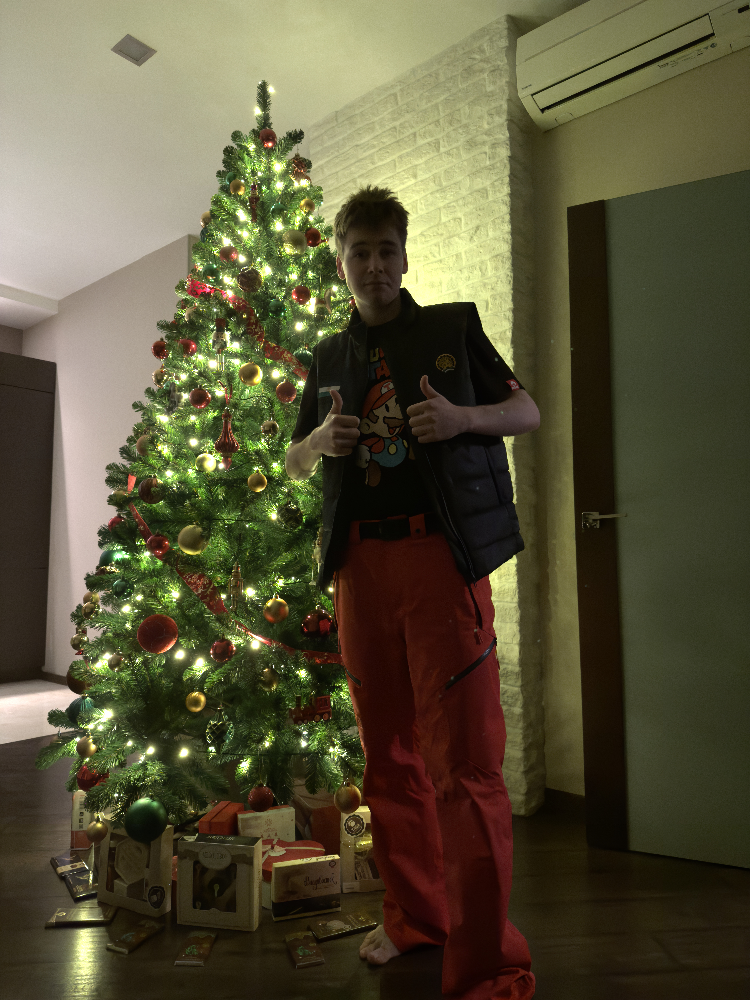

Жду больше пива и конечно же МО-2. Хочется чтобы поскорее уже текущий год закончился и можно было бы продолжать жоско ботать с новыми силами)